In [1]:
import numpy as np

import torch
import torch.nn as nn

import lightning as L
import cv2

import matplotlib.pyplot as plt
import os

import pandas as pd

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


## Data Demonstration

In [2]:
train_data_path = "./CourseOCRTask3/Train/"
test_data_path = "./CourseOCRTask3/Test/"

def read_markup(path: str):
    columns = {i:k for i, k in enumerate(["value", "x1", "y1", "x2", "y2", "x3", "y3", "x4", "y4", "modules"], 1)}
    return pd.read_csv(path, encoding='utf-16', header=None, index_col=0).rename(columns=columns).rename_axis("names")
    
train_data_markup = read_markup(os.path.join(train_data_path, "markup.csv"))
train_data_markup_wo = read_markup(os.path.join(train_data_path, "markup_wo_inverted.csv"))

train_data_markup.head()

,value,x1,y1,x2,y2,x3,y3,x4,y4,modules
names,,,,,,,,,,
fc272e4092ccb147a31e66bc1d10fbfb.png,3601514743345,538,248,1590,225,1597,663,532,676,1010101111000110101100110111001011001101000110...
8cde8cb1b54bca37c9347baf74157d22.png,7000001062307,372,433,360,1289,124,1293,147,431,1010001101010011100011010100111000110101100110...
70a9be0887eae17eabd70c8e607f963f.png,2250001407126,408,230,1224,229,1224,688,414,683,1010010011011000101001110100111000110101100110...
a029e49dff95a15d2cd396d8f62220c8.png,10101427156,335,149,1005,155,1005,438,335,447,1010001101001100100011010011001000110100110010...
82ff01909b6d215170dfc26c7be43074.png,2400745402226,469,237,1388,260,1392,712,464,696,1010100011000110101001110010001010001101110010...


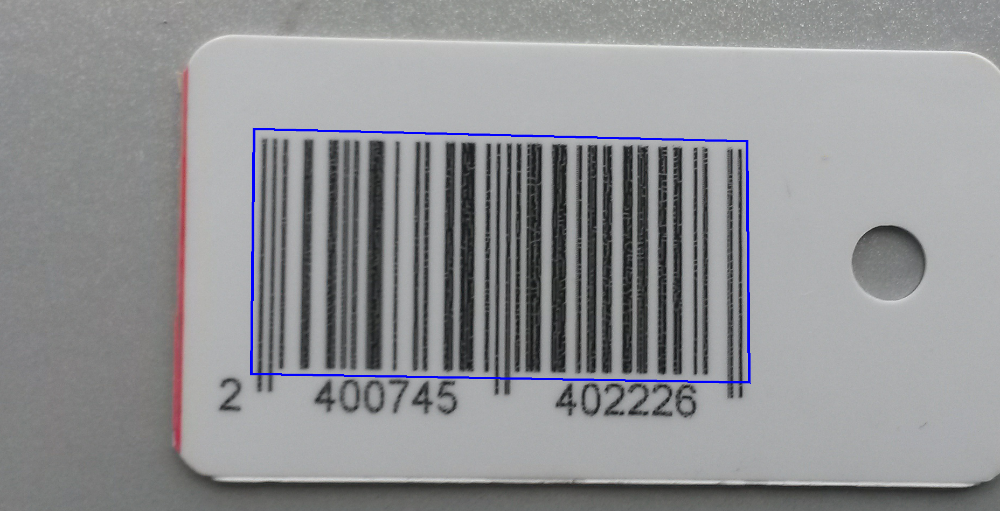

In [4]:
from PIL import Image, ImageDraw

test_img_name = "82ff01909b6d215170dfc26c7be43074.png"

def get_coords(markup, name, swap=False):
    coords = markup.loc[name][['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4']]
    
    if swap:
        return [(coords['y1'], coords['x1']), (coords['y2'], coords['x2']), (coords['y3'], coords['x3']), (coords['y4'], coords['x4'])]
    else:
        return [(coords['x1'], coords['y1']), (coords['x2'], coords['y2']), (coords['x3'], coords['y3']), (coords['x4'], coords['y4'])]

def print_box(markup, name, prefix=train_data_path):
    img_path = os.path.join(prefix, "Images", name)
    img = Image.open(img_path)

    coords = get_coords(train_data_markup, name)

    img_coords = ImageDraw.Draw(img)

    img_coords.polygon(coords, outline='blue', width=5)
    return img
    
print_box(train_data_markup, test_img_name) 

In [5]:
from sklearn.model_selection import train_test_split

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm

IMAGE_SIZE = (256, 256)
TRAIN_SIZE = 0.9
BATCH_SIZE = 256

class EANDataset(Dataset):
    def __init__(self, df, prefix):
        self.df = df
        self.prefix = prefix
        
        self.transforms = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(IMAGE_SIZE, antialias=True)
        ])
        
        self.masks = []
        self.imgs = []
        
        for i in tqdm(range(len(self.df))):
            img_name = self.df.iloc[i].name
            img = np.array(cv2.imread(os.path.join(self.prefix, img_name)))
            
            self.imgs.append(self.transforms(img))
            
            coords = get_coords(self.df, img_name, swap=False)
            markup = Image.new("L", (img.shape[1], img.shape[0]))
            markup_draw = ImageDraw.Draw(markup)
            markup_draw.polygon(coords, fill='white')
            self.masks.append(self.transforms(np.asarray(markup)))
            

    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx):
        img = self.imgs[idx]
        mask = self.masks[idx]
        
        return img, mask
        
train_df, val_df = train_test_split(train_data_markup, train_size=TRAIN_SIZE, random_state=616)

train_dataset = EANDataset(train_df, os.path.join(train_data_path, "Images"))
val_dataset = EANDataset(val_df, os.path.join(train_data_path, "Images"))

  0%|          | 0/7379 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
 29%|██▉       | 2147/7379 [04:19<10:32,  8.27it/s]


KeyboardInterrupt: 

In [ ]:
train_dl = DataLoader(train_dataset, BATCH_SIZE, num_workers=0, shuffle=True)
val_dl = DataLoader(val_dataset, BATCH_SIZE, num_workers=0)

In [ ]:
transforms.ToPILImage()(train_dataset[0][0])

In [ ]:
transforms.ToPILImage()(train_dataset[0][1])

## Model & Training

In [16]:
class Block(nn.Module):
    def __init__(
        self,
        input_nc: int,
        output_nc: int,
        kernel_size: int = 4,
        padding: int = 1,
        stride: int = 2,
        conv=nn.Conv2d,
        norm_type=nn.BatchNorm2d,
        act=nn.ReLU,
        dropout_rate=0.5
    ):
        super().__init__()
        self.input_nc = input_nc
        self.output_nc = output_nc
        self.kernel_size = kernel_size
        self.padding = padding
        self.stride = stride
        self.dropout_rate = dropout_rate

        self.conv = conv
        self.norm_type = norm_type
        self.act = act

        self.net = nn.Sequential(
            self.conv(input_nc, output_nc, kernel_size=self.kernel_size, padding=self.padding, stride=self.stride),
            self.norm_type(output_nc),
            nn.Dropout(p=self.dropout_rate),
            self.act()
        )

    def forward(self, x):
        return self.net(x)


class Unet(nn.Module):
    def __init__(self, input_nc, output_nc, norm_type=nn.BatchNorm2d):
        super().__init__()
        self.input_nc = input_nc
        self.output_nc = output_nc
        self.norm_type = norm_type

        self.encoder_layers = nn.Sequential(
            Block(input_nc=input_nc, output_nc=64, dropout_rate=0.),
            Block(input_nc=64, output_nc=128, dropout_rate=0.1),
            Block(input_nc=128, output_nc=256, dropout_rate=0.1),
            Block(input_nc=256, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=1024, dropout_rate=0.),
            Block(input_nc=1024, output_nc=1024, dropout_rate=0.)
        )
        self.decoder_layers = nn.Sequential(
            Block(input_nc=1024, output_nc=1024, conv=nn.ConvTranspose2d, dropout_rate=0.),
            Block(input_nc=1024, output_nc=512, conv=nn.ConvTranspose2d, dropout_rate=0.),
            Block(input_nc=512, output_nc=512, conv=nn.ConvTranspose2d, dropout_rate=0.1),
            Block(input_nc=512, output_nc=512, conv=nn.ConvTranspose2d, dropout_rate=0.1),
            Block(input_nc=512, output_nc=256, conv=nn.ConvTranspose2d, dropout_rate=0.1),
            Block(input_nc=256, output_nc=128, conv=nn.ConvTranspose2d, dropout_rate=0.1),
            Block(input_nc=128, output_nc=64, conv=nn.ConvTranspose2d, dropout_rate=0.1),
            Block(input_nc=64, output_nc=output_nc, conv=nn.ConvTranspose2d, dropout_rate=0.)
            # nn.Sigmoid()
        )

    def forward(self, x):
        encoder_hist = [x]

        for encoder_layer in self.encoder_layers:
            t = encoder_layer(encoder_hist[-1])
            encoder_hist.append(t)

        output = encoder_hist[-1]
        encoder_hist = encoder_hist[1:-1][::-1]

        hist_ind = 0

        for decoder_layer in self.decoder_layers:
            output = decoder_layer(output)

            if hist_ind < len(encoder_hist):
                output = output + encoder_hist[hist_ind]
                hist_ind += 1

        return output

In [7]:
from torchsummary import summary

summary(Unet(3, 1).to('cuda'), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
       BatchNorm2d-2         [-1, 64, 128, 128]             128
           Dropout-3         [-1, 64, 128, 128]               0
              ReLU-4         [-1, 64, 128, 128]               0
             Block-5         [-1, 64, 128, 128]               0
            Conv2d-6          [-1, 128, 64, 64]         131,200
       BatchNorm2d-7          [-1, 128, 64, 64]             256
           Dropout-8          [-1, 128, 64, 64]               0
              ReLU-9          [-1, 128, 64, 64]               0
            Block-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 32, 32]         524,544
      BatchNorm2d-12          [-1, 256, 32, 32]             512
          Dropout-13          [-1, 256, 32, 32]               0
             ReLU-14          [-1, 256,

In [17]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 0):
    probabilities = torch.clamp(torch.sigmoid(y_pred), min=eps, max=1-eps)
    return torch.mean((1 - probabilities)**gamma * 
           (y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))))

class UnetSegm(L.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = Unet(3, 1)

    def forward(self, inputs):
        return self.model(inputs)

    def training_step(self, batch, batch_idx):
        inputs, targets = batch
        outputs = self.model(inputs)
        loss = focal_loss(targets, outputs)
        self.log("train_loss", loss.item(), prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        inputs, targets = batch
        outputs = self.model(inputs)
        loss = focal_loss(targets, outputs)
        self.log("val_loss", loss.item(), prog_bar=True)
        return loss
    
    def predict_step(self, batch):
        return self.model(batch)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4, weight_decay=5e-4)
        scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, threshold=0.05, cooldown=1, min_lr=1e-5, verbose=True)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss"
            }
        }

In [11]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs

In [112]:
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(monitor="val_loss", save_top_k=3, filename='{epoch}-{val_loss:.6f}', verbose=True)

max_epochs = 50

segm = UnetSegm()

trainer = Trainer(max_epochs=max_epochs, log_every_n_steps=10, callbacks=[checkpoint_callback])
trainer.fit(
    segm,
    train_dl,
    val_dl
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | Unet | 72.6 M
-------------------------------
72.6 M    Trainable params
0         Non-trainable params
72.6 M    Total params
290.556   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 0: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.611]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 0: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.611, val_loss=0.675]

Epoch 0, global step 29: 'val_loss' reached 0.67548 (best 0.67548), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=0-val_loss=0.675485.ckpt' as top 3


Epoch 1: 100%|██████████| 29/29 [00:26<00:00,  1.10it/s, v_num=3, train_loss=0.591, val_loss=0.675]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.591, val_loss=0.663]

Epoch 1, global step 58: 'val_loss' reached 0.66337 (best 0.66337), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=1-val_loss=0.663369.ckpt' as top 3


Epoch 2: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.587, val_loss=0.663]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 2: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.587, val_loss=0.633]

Epoch 2, global step 87: 'val_loss' reached 0.63311 (best 0.63311), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=2-val_loss=0.633112.ckpt' as top 3


Epoch 3: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.585, val_loss=0.633]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 3: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.585, val_loss=0.620]

Epoch 3, global step 116: 'val_loss' reached 0.62025 (best 0.62025), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=3-val_loss=0.620254.ckpt' as top 3


Epoch 4: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.571, val_loss=0.620]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 4: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.571, val_loss=0.602]

Epoch 4, global step 145: 'val_loss' reached 0.60177 (best 0.60177), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=4-val_loss=0.601771.ckpt' as top 3


Epoch 5: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.568, val_loss=0.602]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 5: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.568, val_loss=0.595]

Epoch 5, global step 174: 'val_loss' reached 0.59513 (best 0.59513), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=5-val_loss=0.595131.ckpt' as top 3


Epoch 6: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.566, val_loss=0.595]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 6: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.566, val_loss=0.588]

Epoch 6, global step 203: 'val_loss' reached 0.58777 (best 0.58777), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=6-val_loss=0.587769.ckpt' as top 3


Epoch 7: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.566, val_loss=0.588]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 7: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.566, val_loss=0.572]

Epoch 7, global step 232: 'val_loss' reached 0.57162 (best 0.57162), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=7-val_loss=0.571621.ckpt' as top 3


Epoch 8: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.564, val_loss=0.572]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 8: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.564, val_loss=0.574]

Epoch 8, global step 261: 'val_loss' reached 0.57433 (best 0.57162), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=8-val_loss=0.574330.ckpt' as top 3


Epoch 00009: reducing learning rate of group 0 to 5.0000e-05.
Epoch 9: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.565, val_loss=0.574]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 9: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.565, val_loss=0.565]

Epoch 9, global step 290: 'val_loss' reached 0.56549 (best 0.56549), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=9-val_loss=0.565491.ckpt' as top 3


Epoch 10: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.561, val_loss=0.565]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 10: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.561, val_loss=0.566]

Epoch 10, global step 319: 'val_loss' reached 0.56618 (best 0.56549), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=10-val_loss=0.566182.ckpt' as top 3


Epoch 11: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.562, val_loss=0.566]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 11: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.562, val_loss=0.565]

Epoch 11, global step 348: 'val_loss' reached 0.56483 (best 0.56483), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=11-val_loss=0.564829.ckpt' as top 3


Epoch 12: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.561, val_loss=0.565]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 12: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.561, val_loss=0.563]

Epoch 12, global step 377: 'val_loss' reached 0.56279 (best 0.56279), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=12-val_loss=0.562794.ckpt' as top 3


Epoch 13: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.562, val_loss=0.563]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 13: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.562, val_loss=0.560]

Epoch 13, global step 406: 'val_loss' reached 0.56039 (best 0.56039), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=13-val_loss=0.560389.ckpt' as top 3


Epoch 14: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 14: 100%|██████████| 29/29 [00:28<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.565]

Epoch 14, global step 435: 'val_loss' reached 0.56470 (best 0.56039), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=14-val_loss=0.564699.ckpt' as top 3


Epoch 00015: reducing learning rate of group 0 to 2.5000e-05.
Epoch 15: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.561, val_loss=0.565]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 15: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.561, val_loss=0.559]

Epoch 15, global step 464: 'val_loss' reached 0.55928 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=15-val_loss=0.559275.ckpt' as top 3


Epoch 16: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.556, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 16: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.556, val_loss=0.560]

Epoch 16, global step 493: 'val_loss' reached 0.56038 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=16-val_loss=0.560377.ckpt' as top 3


Epoch 17: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.561, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 17: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.561, val_loss=0.560]

Epoch 17, global step 522: 'val_loss' reached 0.56026 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=17-val_loss=0.560262.ckpt' as top 3


Epoch 18: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.555, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 18: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.555, val_loss=0.561]

Epoch 18, global step 551: 'val_loss' was not in top 3


Epoch 00019: reducing learning rate of group 0 to 1.2500e-05.
Epoch 19: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.561]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 19: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.560]

Epoch 19, global step 580: 'val_loss' reached 0.55957 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=19-val_loss=0.559569.ckpt' as top 3


Epoch 20: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.559, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 20: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.559, val_loss=0.560]

Epoch 20, global step 609: 'val_loss' reached 0.55997 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=20-val_loss=0.559969.ckpt' as top 3


Epoch 21: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.553, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 21: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.553, val_loss=0.561]

Epoch 21, global step 638: 'val_loss' was not in top 3


Epoch 22: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.561]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 22: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.559]

Epoch 22, global step 667: 'val_loss' reached 0.55942 (best 0.55928), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=22-val_loss=0.559416.ckpt' as top 3


Epoch 00023: reducing learning rate of group 0 to 1.0000e-05.
Epoch 23: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.556, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 23: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.556, val_loss=0.559]

Epoch 23, global step 696: 'val_loss' reached 0.55887 (best 0.55887), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=23-val_loss=0.558872.ckpt' as top 3


Epoch 24: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.560, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 24: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.560, val_loss=0.559]

Epoch 24, global step 725: 'val_loss' reached 0.55912 (best 0.55887), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=24-val_loss=0.559120.ckpt' as top 3


Epoch 25: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 25: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.559]

Epoch 25, global step 754: 'val_loss' was not in top 3


Epoch 26: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.556, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 26: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.556, val_loss=0.559]

Epoch 26, global step 783: 'val_loss' reached 0.55900 (best 0.55887), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=26-val_loss=0.558996.ckpt' as top 3


Epoch 27: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 27: 100%|██████████| 29/29 [00:28<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.560]

Epoch 27, global step 812: 'val_loss' was not in top 3


Epoch 28: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.555, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 28: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.555, val_loss=0.559]

Epoch 28, global step 841: 'val_loss' was not in top 3


Epoch 29: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.556, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 29: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.556, val_loss=0.559]

Epoch 29, global step 870: 'val_loss' was not in top 3


Epoch 30: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.555, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 30: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.555, val_loss=0.558]

Epoch 30, global step 899: 'val_loss' reached 0.55848 (best 0.55848), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=30-val_loss=0.558475.ckpt' as top 3


Epoch 31: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.558]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 31: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.558]

Epoch 31, global step 928: 'val_loss' reached 0.55849 (best 0.55848), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=31-val_loss=0.558489.ckpt' as top 3


Epoch 32: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.558]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 32: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.560]

Epoch 32, global step 957: 'val_loss' was not in top 3


Epoch 33: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.560, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 33: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.560, val_loss=0.559]

Epoch 33, global step 986: 'val_loss' was not in top 3


Epoch 34: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.553, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 34: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.553, val_loss=0.560]

Epoch 34, global step 1015: 'val_loss' was not in top 3


Epoch 35: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 35: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.559]

Epoch 35, global step 1044: 'val_loss' was not in top 3


Epoch 36: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 36: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.559]

Epoch 36, global step 1073: 'val_loss' reached 0.55880 (best 0.55848), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=36-val_loss=0.558805.ckpt' as top 3


Epoch 37: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.554, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 37: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.554, val_loss=0.560]

Epoch 37, global step 1102: 'val_loss' was not in top 3


Epoch 38: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.559, val_loss=0.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 38: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.559, val_loss=0.558]

Epoch 38, global step 1131: 'val_loss' reached 0.55833 (best 0.55833), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=38-val_loss=0.558327.ckpt' as top 3


Epoch 39: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.558]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 39: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.559]

Epoch 39, global step 1160: 'val_loss' was not in top 3


Epoch 40: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 40: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.558]

Epoch 40, global step 1189: 'val_loss' reached 0.55838 (best 0.55833), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=40-val_loss=0.558379.ckpt' as top 3


Epoch 41: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.558]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 41: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.559]

Epoch 41, global step 1218: 'val_loss' was not in top 3


Epoch 42: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 42: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.559]

Epoch 42, global step 1247: 'val_loss' was not in top 3


Epoch 43: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.554, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 43: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.554, val_loss=0.559]

Epoch 43, global step 1276: 'val_loss' was not in top 3


Epoch 44: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.558, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 44: 100%|██████████| 29/29 [00:28<00:00,  1.04it/s, v_num=3, train_loss=0.558, val_loss=0.559]

Epoch 44, global step 1305: 'val_loss' was not in top 3


Epoch 45: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.557, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 45: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.557, val_loss=0.559]

Epoch 45, global step 1334: 'val_loss' was not in top 3


Epoch 46: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.560, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 46: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.560, val_loss=0.559]

Epoch 46, global step 1363: 'val_loss' was not in top 3


Epoch 47: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.556, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 47: 100%|██████████| 29/29 [00:28<00:00,  1.03it/s, v_num=3, train_loss=0.556, val_loss=0.559]

Epoch 47, global step 1392: 'val_loss' was not in top 3


Epoch 48: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.554, val_loss=0.559]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 48: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.554, val_loss=0.558]

Epoch 48, global step 1421: 'val_loss' reached 0.55814 (best 0.55814), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=48-val_loss=0.558143.ckpt' as top 3


Epoch 49: 100%|██████████| 29/29 [00:26<00:00,  1.09it/s, v_num=3, train_loss=0.553, val_loss=0.558]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 49: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.553, val_loss=0.559]

Epoch 49, global step 1450: 'val_loss' was not in top 3
`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 29/29 [00:27<00:00,  1.04it/s, v_num=3, train_loss=0.553, val_loss=0.559]


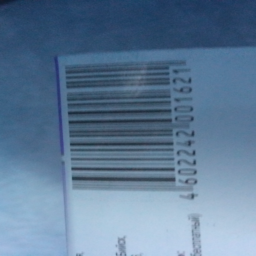

In [115]:
transforms.ToPILImage()(val_dataset[10][0])

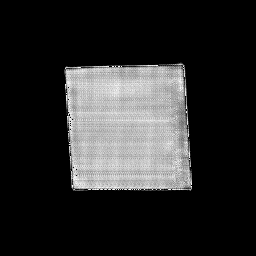

In [116]:
segm.eval()
transforms.ToPILImage()(segm.forward(val_dataset[10][0][None, :])[0])

## Evaluating Detection

In [13]:
segm = UnetSegm.load_from_checkpoint("/home/jupyter/work/resources/ocr3/data/lightning_logs/version_3/checkpoints/epoch=48-val_loss=0.558143.ckpt").to('cpu')

In [145]:
test_data_markup = read_markup("./markup.csv")
test_images_path = "./CourseOCRTask3/Test/Images/"

test_data_markup.iloc[:, [0, 9]] = 0
test_data_markup.head()

,value,x1,y1,x2,y2,x3,y3,x4,y4,modules
names,,,,,,,,,,
5825c9d1deb6572b6dba440d5c6482bf.png,-,569,485,1644,452,1707,1335,583,1356,-
f9bf5d96a0cf5d64aac4eb5806554224.png,-,686,446,1833,528,1747,1338,611,1117,-
a154b624c06072da1a01c97ebc3894c1.png,-,536,483,1552,313,1608,767,620,939,-
749003091876fc58be69db54bbaae8f1.png,-,522,270,1541,229,1566,636,537,688,-
560ca4ac1260313eb5979140c4f9ef31.png,-,553,248,1648,265,1637,745,549,736,-


In [146]:
len(test_data_markup)

100

In [147]:
def predict_box(img_tensor, model):
    model.eval()
    with torch.no_grad():
        output = model(img_tensor[None, :])[0].cpu().permute(1, 2, 0).numpy()
        
    output[output > 0.5] = 1.
    output = (output * 255).astype(np.uint8)
    
    return output

  0%|          | 0/100 [00:00<?, ?it/s]

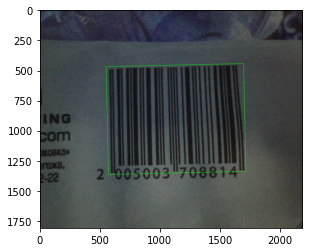

  1%|          | 1/100 [00:00<01:37,  1.02it/s]

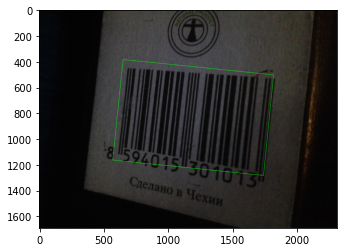

  2%|▏         | 2/100 [00:01<01:35,  1.03it/s]

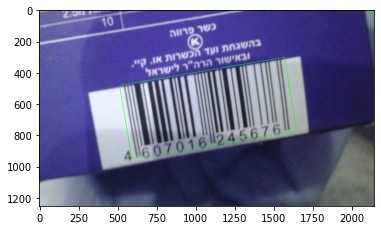

  3%|▎         | 3/100 [00:02<01:25,  1.13it/s]

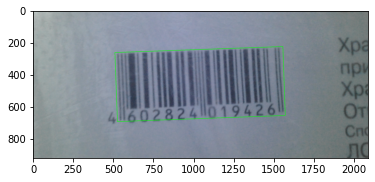

  4%|▍         | 4/100 [00:03<01:15,  1.28it/s]

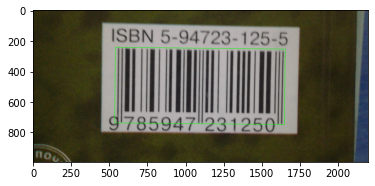

  5%|▌         | 5/100 [00:04<01:10,  1.35it/s]

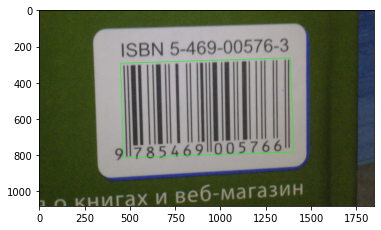

  6%|▌         | 6/100 [00:04<01:07,  1.40it/s]

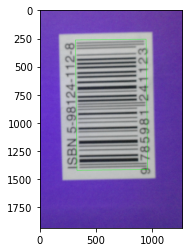

  7%|▋         | 7/100 [00:05<01:05,  1.43it/s]

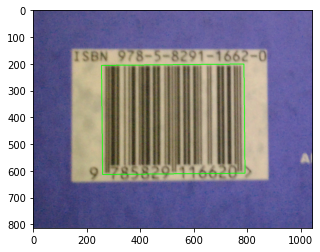

  8%|▊         | 8/100 [00:05<00:58,  1.57it/s]

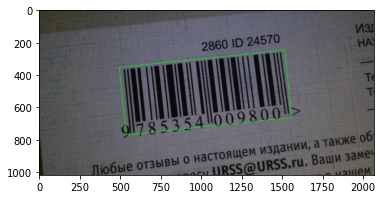

  9%|▉         | 9/100 [00:06<00:59,  1.54it/s]

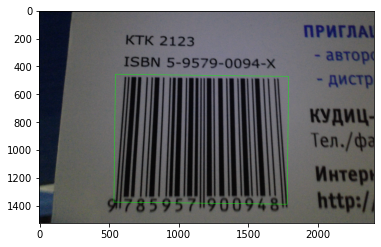

 10%|█         | 10/100 [00:07<01:05,  1.37it/s]

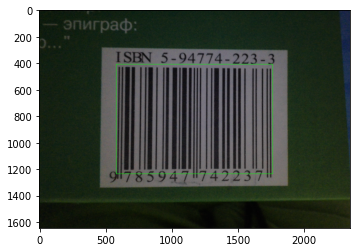

 11%|█         | 11/100 [00:08<01:11,  1.25it/s]

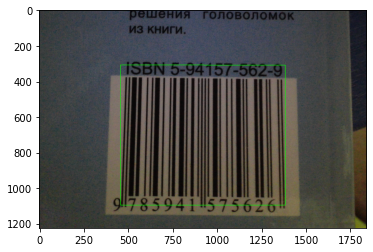

 12%|█▏        | 12/100 [00:09<01:07,  1.30it/s]

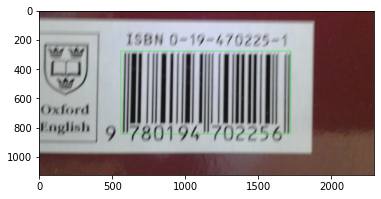

 13%|█▎        | 13/100 [00:09<01:05,  1.33it/s]

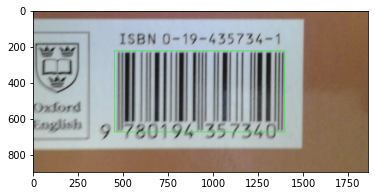

 14%|█▍        | 14/100 [00:10<01:11,  1.20it/s]

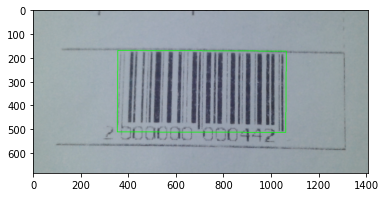

 15%|█▌        | 15/100 [00:11<01:02,  1.36it/s]

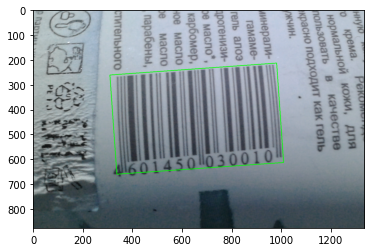

 16%|█▌        | 16/100 [00:11<00:56,  1.48it/s]

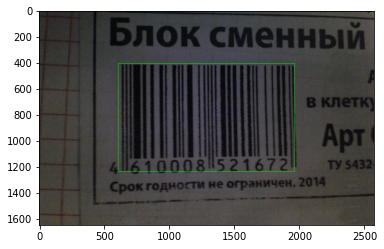

 17%|█▋        | 17/100 [00:12<01:05,  1.26it/s]

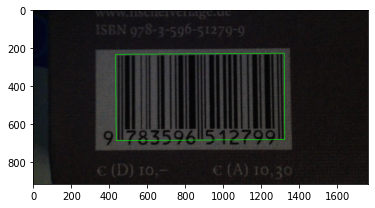

 18%|█▊        | 18/100 [00:13<01:00,  1.35it/s]

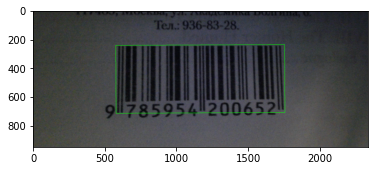

 19%|█▉        | 19/100 [00:14<00:58,  1.39it/s]

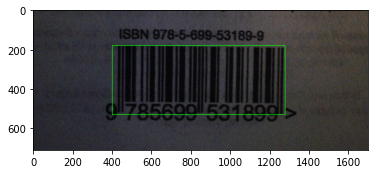

 20%|██        | 20/100 [00:14<00:52,  1.52it/s]

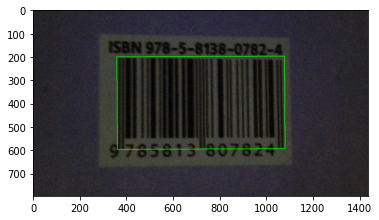

 21%|██        | 21/100 [00:15<00:49,  1.61it/s]

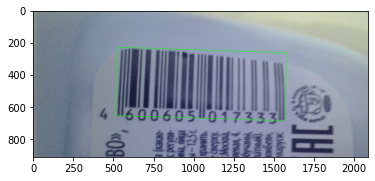

 22%|██▏       | 22/100 [00:15<00:49,  1.57it/s]

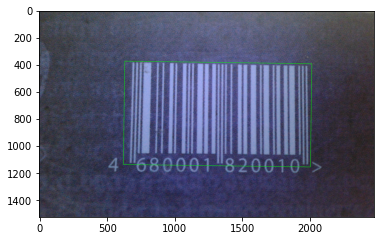

 23%|██▎       | 23/100 [00:16<00:56,  1.36it/s]

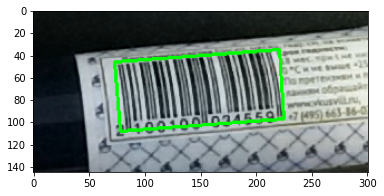

 24%|██▍       | 24/100 [00:17<00:47,  1.61it/s]

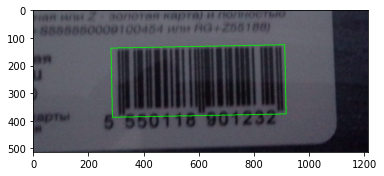

 25%|██▌       | 25/100 [00:17<00:42,  1.77it/s]

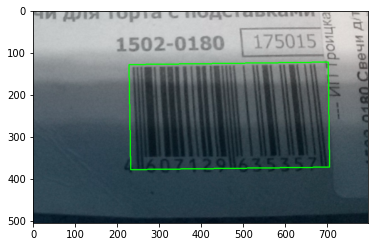

 26%|██▌       | 26/100 [00:18<00:38,  1.91it/s]

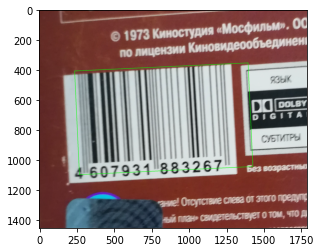

 27%|██▋       | 27/100 [00:18<00:42,  1.70it/s]

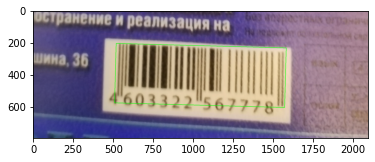

 28%|██▊       | 28/100 [00:19<00:41,  1.72it/s]

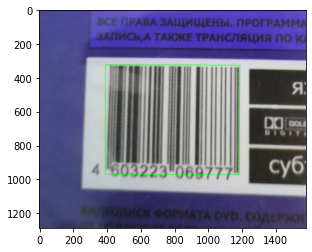

 29%|██▉       | 29/100 [00:20<00:42,  1.67it/s]

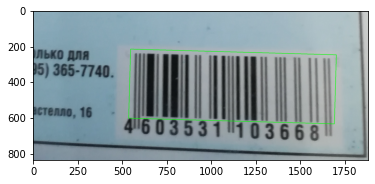

 30%|███       | 30/100 [00:20<00:41,  1.70it/s]

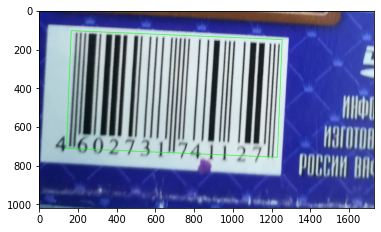

 31%|███       | 31/100 [00:21<00:41,  1.65it/s]

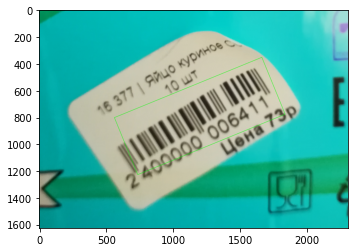

 32%|███▏      | 32/100 [00:22<00:47,  1.43it/s]

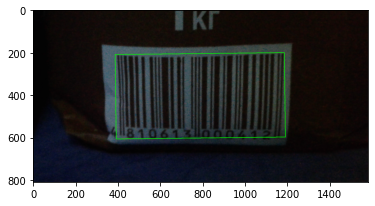

 33%|███▎      | 33/100 [00:22<00:43,  1.54it/s]

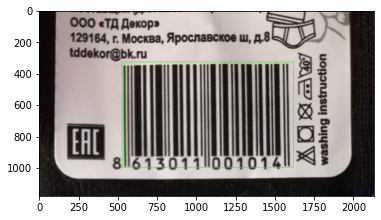

 34%|███▍      | 34/100 [00:23<00:44,  1.49it/s]

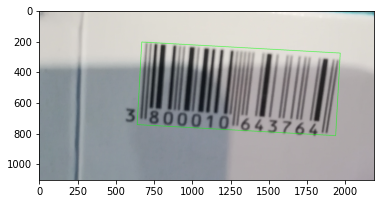

 35%|███▌      | 35/100 [00:24<00:43,  1.48it/s]

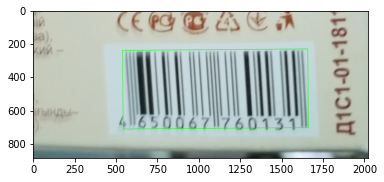

 36%|███▌      | 36/100 [00:24<00:41,  1.53it/s]

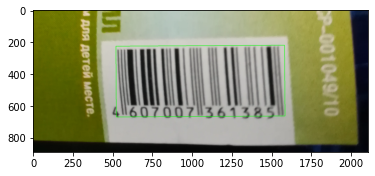

 37%|███▋      | 37/100 [00:25<00:40,  1.56it/s]

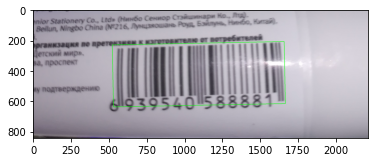

 38%|███▊      | 38/100 [00:25<00:38,  1.59it/s]

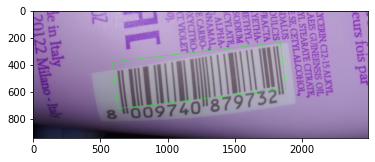

 39%|███▉      | 39/100 [00:26<00:39,  1.56it/s]

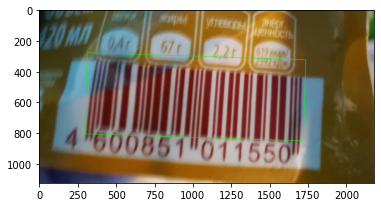

 40%|████      | 40/100 [00:27<00:39,  1.51it/s]

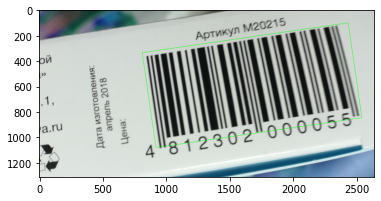

 41%|████      | 41/100 [00:28<00:42,  1.40it/s]

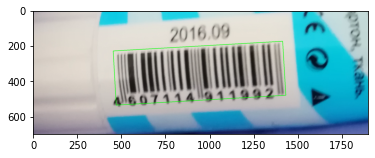

 42%|████▏     | 42/100 [00:28<00:37,  1.53it/s]

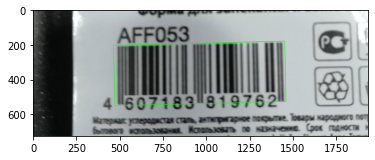

 43%|████▎     | 43/100 [00:29<00:35,  1.63it/s]

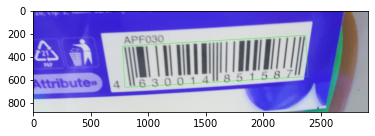

 44%|████▍     | 44/100 [00:29<00:36,  1.55it/s]

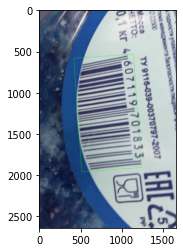

 45%|████▌     | 45/100 [00:30<00:40,  1.34it/s]

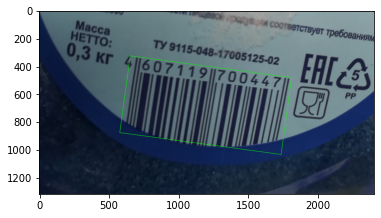

 46%|████▌     | 46/100 [00:31<00:41,  1.29it/s]

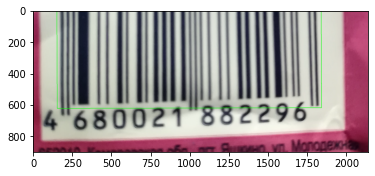

 47%|████▋     | 47/100 [00:32<00:38,  1.37it/s]

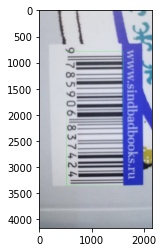

 48%|████▊     | 48/100 [00:33<00:51,  1.02it/s]

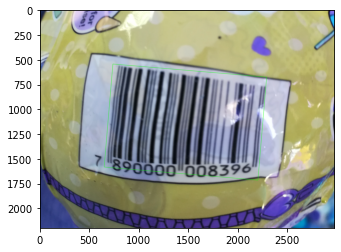

 49%|████▉     | 49/100 [00:35<00:56,  1.11s/it]

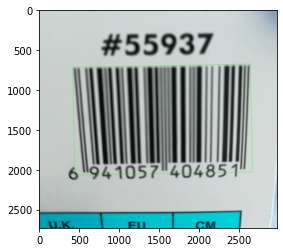

 50%|█████     | 50/100 [00:36<01:02,  1.26s/it]

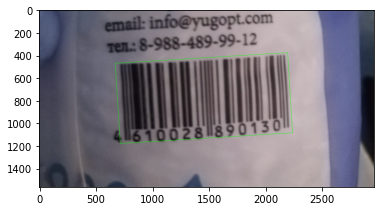

 51%|█████     | 51/100 [00:38<00:59,  1.21s/it]

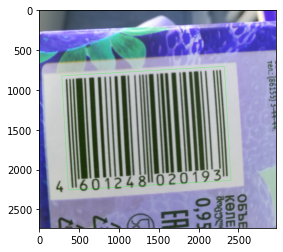

 52%|█████▏    | 52/100 [00:39<01:04,  1.34s/it]

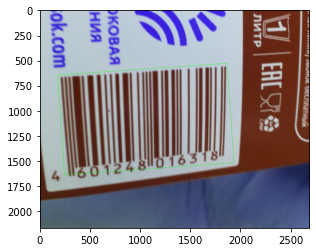

 53%|█████▎    | 53/100 [00:40<01:01,  1.32s/it]

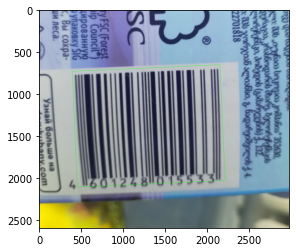

 54%|█████▍    | 54/100 [00:42<01:04,  1.39s/it]

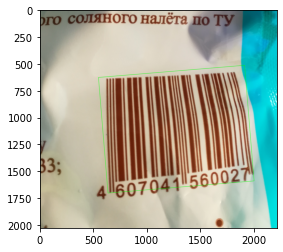

 55%|█████▌    | 55/100 [00:43<00:57,  1.29s/it]

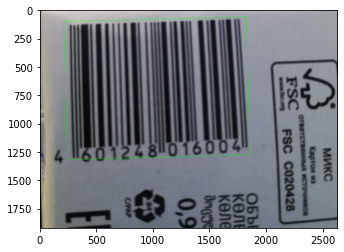

 56%|█████▌    | 56/100 [00:44<00:54,  1.24s/it]

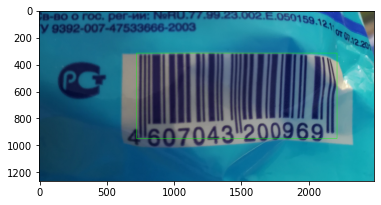

 57%|█████▋    | 57/100 [00:45<00:48,  1.12s/it]

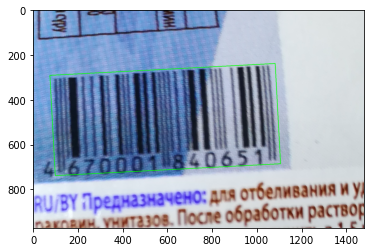

 58%|█████▊    | 58/100 [00:46<00:39,  1.05it/s]

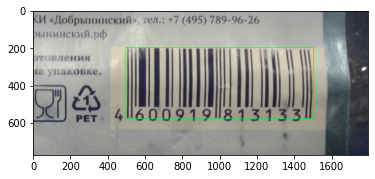

 59%|█████▉    | 59/100 [00:46<00:34,  1.20it/s]

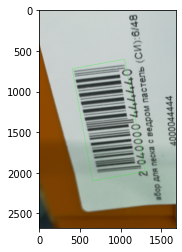

 60%|██████    | 60/100 [00:47<00:35,  1.14it/s]

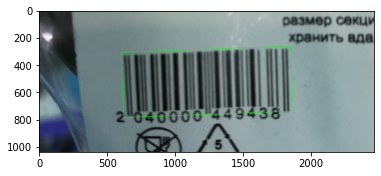

 61%|██████    | 61/100 [00:48<00:31,  1.22it/s]

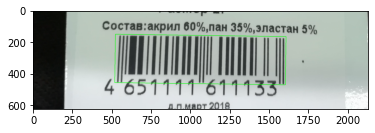

 62%|██████▏   | 62/100 [00:48<00:27,  1.38it/s]

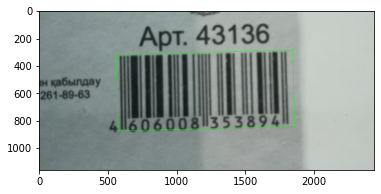

 63%|██████▎   | 63/100 [00:49<00:26,  1.38it/s]

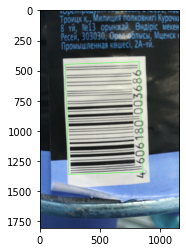

 64%|██████▍   | 64/100 [00:50<00:24,  1.44it/s]

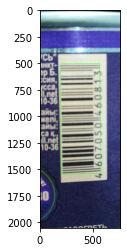

 65%|██████▌   | 65/100 [00:50<00:22,  1.55it/s]

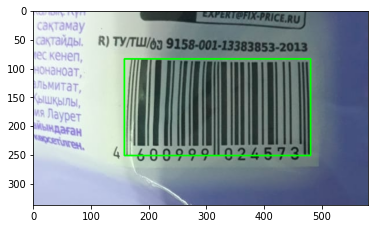

 66%|██████▌   | 66/100 [00:51<00:18,  1.81it/s]

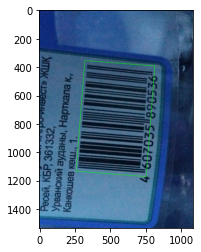

 67%|██████▋   | 67/100 [00:51<00:18,  1.76it/s]

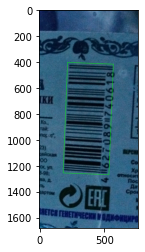

 68%|██████▊   | 68/100 [00:52<00:17,  1.80it/s]

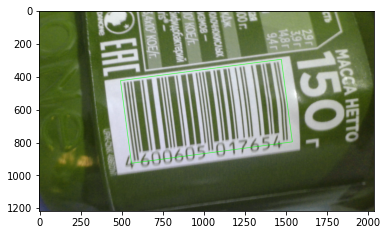

 69%|██████▉   | 69/100 [00:52<00:18,  1.64it/s]

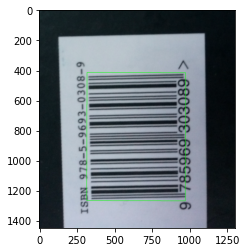

 70%|███████   | 70/100 [00:53<00:18,  1.64it/s]

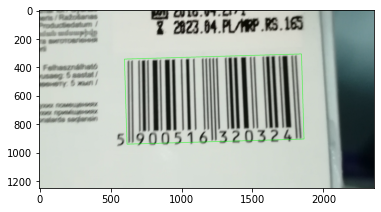

 71%|███████   | 71/100 [00:54<00:19,  1.52it/s]

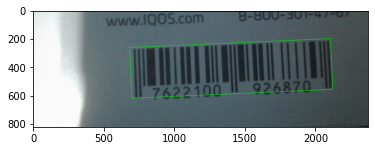

 72%|███████▏  | 72/100 [00:54<00:18,  1.55it/s]

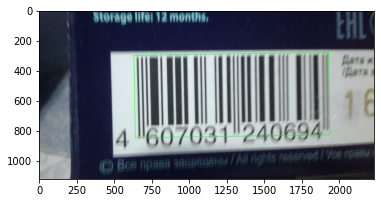

 73%|███████▎  | 73/100 [00:55<00:18,  1.48it/s]

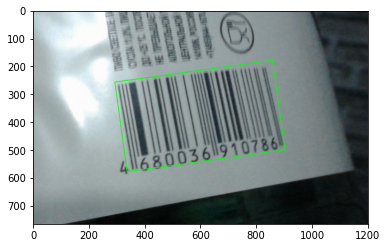

 74%|███████▍  | 74/100 [00:56<00:16,  1.60it/s]

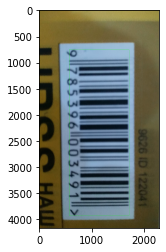

 75%|███████▌  | 75/100 [00:57<00:23,  1.07it/s]

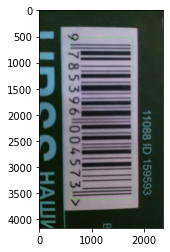

 76%|███████▌  | 76/100 [00:59<00:27,  1.16s/it]

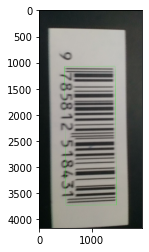

 77%|███████▋  | 77/100 [01:00<00:28,  1.22s/it]

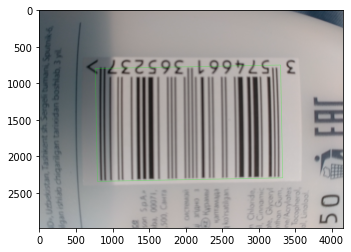

 78%|███████▊  | 78/100 [01:03<00:34,  1.57s/it]

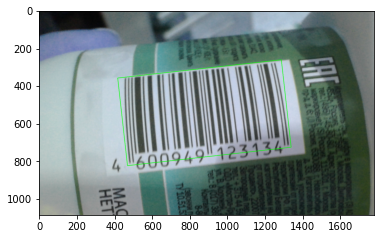

 79%|███████▉  | 79/100 [01:04<00:29,  1.42s/it]

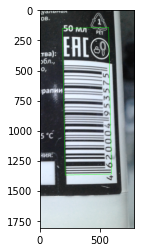

 80%|████████  | 80/100 [01:04<00:22,  1.14s/it]

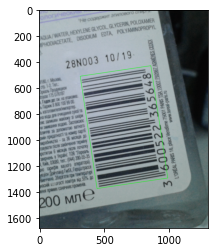

 81%|████████  | 81/100 [01:05<00:18,  1.00it/s]

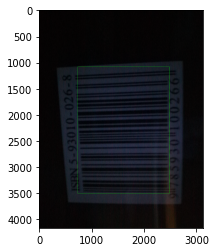

 82%|████████▏ | 82/100 [01:07<00:24,  1.36s/it]

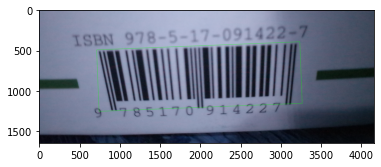

 83%|████████▎ | 83/100 [01:09<00:23,  1.37s/it]

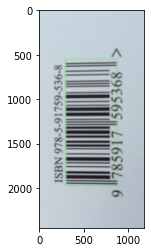

 84%|████████▍ | 84/100 [01:09<00:18,  1.18s/it]

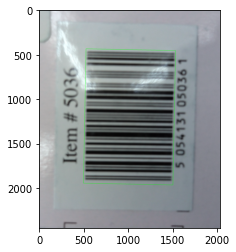

 85%|████████▌ | 85/100 [01:10<00:17,  1.15s/it]

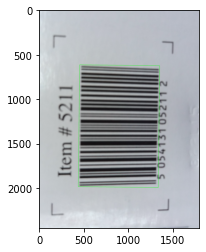

 86%|████████▌ | 86/100 [01:11<00:15,  1.09s/it]

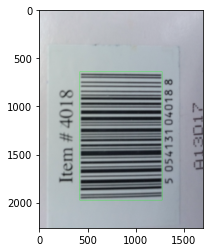

 87%|████████▋ | 87/100 [01:12<00:13,  1.03s/it]

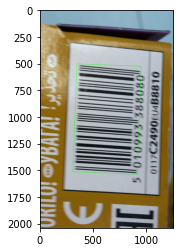

 88%|████████▊ | 88/100 [01:13<00:11,  1.07it/s]

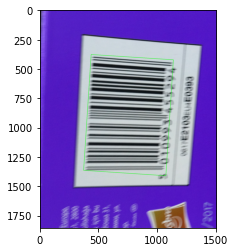

 89%|████████▉ | 89/100 [01:14<00:09,  1.15it/s]

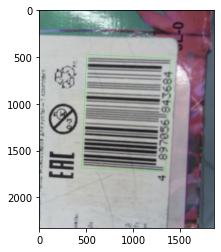

 90%|█████████ | 90/100 [01:15<00:09,  1.11it/s]

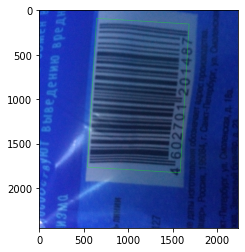

 91%|█████████ | 91/100 [01:16<00:08,  1.02it/s]

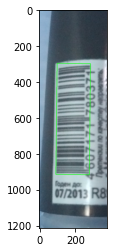

 92%|█████████▏| 92/100 [01:16<00:06,  1.25it/s]

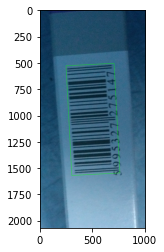

 93%|█████████▎| 93/100 [01:17<00:05,  1.33it/s]

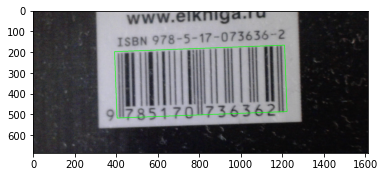

 94%|█████████▍| 94/100 [01:17<00:04,  1.45it/s]

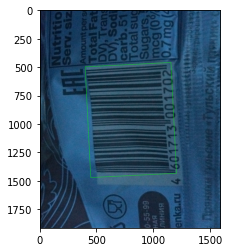

 95%|█████████▌| 95/100 [01:18<00:03,  1.39it/s]

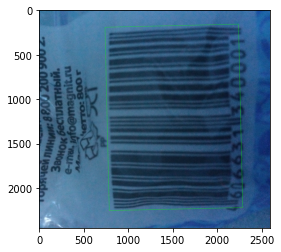

 96%|█████████▌| 96/100 [01:20<00:03,  1.05it/s]

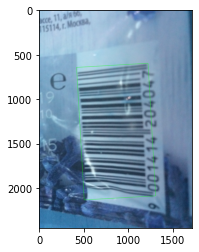

 97%|█████████▋| 97/100 [01:21<00:02,  1.06it/s]

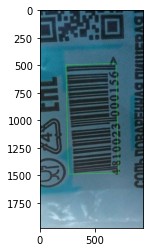

 98%|█████████▊| 98/100 [01:21<00:01,  1.20it/s]

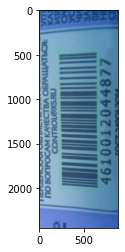

 99%|█████████▉| 99/100 [01:22<00:00,  1.31it/s]

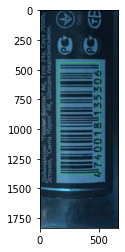

100%|██████████| 100/100 [01:22<00:00,  1.21it/s]


In [148]:
from torchvision import transforms

def process_img(img_name, path):
    tf = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize(IMAGE_SIZE, antialias=True)
    ])
    
    img = np.array(cv2.imread(os.path.join(path, img_name)))

    img_tensor = tf(img)
    
    box = predict_box(img_tensor, segm.model)
    box = cv2.resize(box, dsize=(img.shape[1], img.shape[0]), interpolation=cv2.INTER_CUBIC)
    
    contours, hierarchy = cv2.findContours(box, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) 
    contour = sorted(contours, key=cv2.contourArea, reverse= True)[0]
    rect = cv2.minAreaRect(contour)
    
    rect = np.int0(cv2.boxPoints(rect))                 
    
    img_draw = cv2.drawContours(img, [rect], 0, (0, 255, 0), 2)
    plt.imshow(img_draw)
    plt.show()
    
    return rect.reshape(-1)
    
for i in tqdm(range(len(test_data_markup))):
    img_name = test_data_markup.iloc[i].name
    
    preds = process_img(img_name, test_images_path)
    test_data_markup.iloc[[i], 1:9] = preds

In [209]:
segm_markup = test_data_markup.reset_index()
segm_markup.head()

,names,value,x1,y1,x2,y2,x3,y3,x4,y4,modules
0,5825c9d1deb6572b6dba440d5c6482bf.png,-,548,469,1691,444,1711,1338,568,1363,-
1,f9bf5d96a0cf5d64aac4eb5806554224.png,-,572,1162,652,383,1821,502,1742,1281,-
2,a154b624c06072da1a01c97ebc3894c1.png,-,515,481,1570,301,1649,770,594,949,-
3,749003091876fc58be69db54bbaae8f1.png,-,510,263,1557,226,1572,653,526,691,-
4,560ca4ac1260313eb5979140c4f9ef31.png,-,535,737,540,243,1654,255,1649,748,-


In [212]:
segm_markup.to_csv("./answer.csv", encoding='utf-16', header=None, index=None)

In [215]:
!python3 ./course_ocr_t3/evaluate.py

Checking answer (/home/jupyter/work/resources/ocr3/data/answer.csv) against markup(/home/jupyter/work/resources/ocr3/data/markup.csv)
recognition_accuracy=0.0
detection_result=1.0
score=0.35


## Recognition

In [3]:
train_data_markup

,value,x1,y1,x2,y2,x3,y3,x4,y4,modules
names,,,,,,,,,,
fc272e4092ccb147a31e66bc1d10fbfb.png,3601514743345,538,248,1590,225,1597,663,532,676,1010101111000110101100110111001011001101000110...
8cde8cb1b54bca37c9347baf74157d22.png,7000001062307,372,433,360,1289,124,1293,147,431,1010001101010011100011010100111000110101100110...
70a9be0887eae17eabd70c8e607f963f.png,2250001407126,408,230,1224,229,1224,688,414,683,1010010011011000101001110100111000110101100110...
a029e49dff95a15d2cd396d8f62220c8.png,10101427156,335,149,1005,155,1005,438,335,447,1010001101001100100011010011001000110100110010...
82ff01909b6d215170dfc26c7be43074.png,2400745402226,469,237,1388,260,1392,712,464,696,1010100011000110101001110010001010001101110010...
...,...,...,...,...,...,...,...,...,...,...
c532771808e76e333ba9e959853886f3.png,4823077510083,86,54,622,53,622,202,87,202,1010110111001101101111010001101001000100100010...
186338ad8f3ff17b6082c023f24563f0.png,4823077505386,109,44,664,55,668,206,107,192,1010110111001101101111010001101001000100100010...
5bac8f6c9bd5e99f92eb396442974c4e.png,4823077505492,121,27,704,13,704,168,120,187,1010110111001101101111010001101001000100100010...


In [4]:
train_data_markup["value"].astype(str)

names
fc272e4092ccb147a31e66bc1d10fbfb.png    3601514743345
8cde8cb1b54bca37c9347baf74157d22.png    7000001062307
70a9be0887eae17eabd70c8e607f963f.png    2250001407126
a029e49dff95a15d2cd396d8f62220c8.png      10101427156
82ff01909b6d215170dfc26c7be43074.png    2400745402226
                                            ...      
c532771808e76e333ba9e959853886f3.png    4823077510083
186338ad8f3ff17b6082c023f24563f0.png    4823077505386
5bac8f6c9bd5e99f92eb396442974c4e.png    4823077505492
6247db3e424148a859ebf2180f1dcb6f.png    2010000019696
82d22dc68401a5b173158ae7252b0ab3.png    8691190544256
Name: value, Length: 8199, dtype: object

In [5]:
filtered_data = train_data_markup[train_data_markup["value"].astype(str).map(len) == 13]
filtered_data

,value,x1,y1,x2,y2,x3,y3,x4,y4,modules
names,,,,,,,,,,
fc272e4092ccb147a31e66bc1d10fbfb.png,3601514743345,538,248,1590,225,1597,663,532,676,1010101111000110101100110111001011001101000110...
8cde8cb1b54bca37c9347baf74157d22.png,7000001062307,372,433,360,1289,124,1293,147,431,1010001101010011100011010100111000110101100110...
70a9be0887eae17eabd70c8e607f963f.png,2250001407126,408,230,1224,229,1224,688,414,683,1010010011011000101001110100111000110101100110...
82ff01909b6d215170dfc26c7be43074.png,2400745402226,469,237,1388,260,1392,712,464,696,1010100011000110101001110010001010001101110010...
22487c491adb42f1c48e630c0af253fa.png,2670348154611,347,93,1021,93,1021,279,340,275,1010101111011101101001110100001010001100010010...
...,...,...,...,...,...,...,...,...,...,...
c532771808e76e333ba9e959853886f3.png,4823077510083,86,54,622,53,622,202,87,202,1010110111001101101111010001101001000100100010...
186338ad8f3ff17b6082c023f24563f0.png,4823077505386,109,44,664,55,668,206,107,192,1010110111001101101111010001101001000100100010...
5bac8f6c9bd5e99f92eb396442974c4e.png,4823077505492,121,27,704,13,704,168,120,187,1010110111001101101111010001101001000100100010...


In [6]:
filtered_data.iloc[0, 1:9].to_numpy()

array([538, 248, 1590, 225, 1597, 663, 532, 676], dtype=object)

In [86]:
from sklearn.model_selection import train_test_split

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm

IMAGE_SIZE = (256, 256)
TRAIN_SIZE = 0.9

class EANDataset(Dataset):
    def __init__(self, df, prefix):
        self.df = df
        self.prefix = prefix
        
        self.transforms = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(IMAGE_SIZE, antialias=True)
        ])
        
        self.barcode_values = []
        self.imgs = []
        
        for i in tqdm(range(len(self.df))):
            img_name = self.df.iloc[i].name
            x1, y1, x2, y2, x3, y3, x4, y4 = self.df.iloc[i, 1:9].to_numpy()
            
            img = np.array(cv2.imread(os.path.join(self.prefix, img_name)))
            
            min_y = min([y1, y2, y3, y4])
            max_y = max([y1, y2, y3, y4])
            min_x = min([x1, x2, x3, x4])
            max_x = max([x1, x2, x3, x4])
            img = img[min_y:max_y+1, min_x:max_x+1]
            
            if img.shape[0] > img.shape[1]:
                img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
            
            self.imgs.append(self.transforms(img))
            value = list(map(int, list(str(self.df.iloc[i]["value"]))))
            self.barcode_values.append(value)

    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx):
        img = self.imgs[idx]
        value = self.barcode_values[idx]

        return img, torch.tensor(value)
        
train_df, val_df = train_test_split(filtered_data, train_size=TRAIN_SIZE, random_state=616)

train_dataset = EANDataset(train_df, os.path.join(train_data_path, "Images"))
val_dataset = EANDataset(val_df, os.path.join(train_data_path, "Images"))

100%|██████████| 816/816 [01:25<00:00,  9.51it/s]


In [118]:
BATCH_SIZE = 128
train_dl = DataLoader(train_dataset, BATCH_SIZE, num_workers=0, shuffle=True)
val_dl = DataLoader(val_dataset, BATCH_SIZE, num_workers=0)

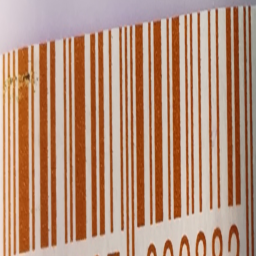

In [119]:
transforms.ToPILImage()(train_dataset[9][0])

In [120]:
class RNNModel(nn.Module):
    def __init__(self, n_classes: int = 10, hidden_dim: int = 256, seq_len: int = 13):
        super().__init__()
        
        self.hidden_dim = hidden_dim
        self.seq_len = seq_len

        self.encoder = nn.Sequential(
            Block(input_nc=3, output_nc=64, dropout_rate=0.),
            Block(input_nc=64, output_nc=128, dropout_rate=0.0),
            Block(input_nc=128, output_nc=256, dropout_rate=0.1),
            Block(input_nc=256, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=512, dropout_rate=0.1),
            Block(input_nc=512, output_nc=1024, dropout_rate=0.),
            Block(input_nc=1024, output_nc=2048, dropout_rate=0.)
        )
        
        seq_i = nn.Sequential(
            nn.Linear(2048, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, hidden_dim * 2)
        )
        self.seqs = nn.ModuleList([seq_i for _ in range(self.seq_len)])
        self.act = nn.LeakyReLU(0.2)
        
        self.lstm = nn.LSTM(hidden_dim * 2, hidden_dim, num_layers=1, bidirectional=True, batch_first=True)
        self.head = nn.Sequential(
            nn.Linear(hidden_dim * 2, 128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, n_classes)
        )
        
    def forward(self, x):
        x = self.encoder(x).flatten(1)
        x = self.act(x)

        seq = [self.seqs[i](x).to(x.device).unsqueeze(1) for i in range(self.seq_len)]

        x = torch.cat(seq, dim=1).to(x.device)
        x, _ = self.lstm(x)
    
        x = self.head(self.act(x)).permute(0, 2, 1)
        
        return x

In [121]:
test_model = RNNModel(3).to('cuda')
test_x = torch.ones((4, 3, 256, 256)).to('cuda')

test_model(test_x).shape

torch.Size([4, 3, 13])

In [122]:
import lightning as L
from torch.optim.lr_scheduler import ReduceLROnPlateau

class EANDecoder(L.LightningModule):
    def __init__(self, n_classes, hidden_dim: int = 256):
        super().__init__()
        self.n_classes = n_classes
        self.model = RNNModel(n_classes, hidden_dim=hidden_dim)
        self.criterion = nn.CrossEntropyLoss()

    def forward(self, inputs):
        return self.model(inputs)

    def training_step(self, batch, batch_idx):
        inputs, targets = batch
        outputs = self.model(inputs)
        loss = self.criterion(outputs, targets) 
        self.log("train_loss", loss.item(), prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        inputs, targets = batch
        outputs = self.model(inputs)
        loss = self.criterion(outputs, targets) 
        self.log("val_loss", loss.item(), prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4, weight_decay=5e-4)
        scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=4, threshold=0.05, cooldown=1, min_lr=1e-5, verbose=True)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss"
            }
        }

In [123]:
decoder = EANDecoder(10, 256)

In [ ]:
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(monitor="val_loss", save_top_k=3, filename='{epoch}-{val_loss:.4f}', verbose=True)

max_epochs = 50

trainer = Trainer(max_epochs=max_epochs, log_every_n_steps=10, callbacks=[checkpoint_callback])
trainer.fit(
    decoder,
    train_dl,
    val_dl
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | RNNModel         | 56.1 M
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
56.1 M    Trainable params
0         Non-trainable params
56.1 M    Total params
224.232   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 0: 100%|██████████| 58/58 [00:15<00:00,  3.80it/s, v_num=10, train_loss=2.130]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 0: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=2.130, val_loss=2.130]

Epoch 0, global step 58: 'val_loss' reached 2.12646 (best 2.12646), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=0-val_loss=2.1265.ckpt' as top 3


Epoch 1: 100%|██████████| 58/58 [00:15<00:00,  3.80it/s, v_num=10, train_loss=1.960, val_loss=2.130]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=1.960, val_loss=1.990]

Epoch 1, global step 116: 'val_loss' reached 1.99426 (best 1.99426), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=1-val_loss=1.9943.ckpt' as top 3


Epoch 2: 100%|██████████| 58/58 [00:15<00:00,  3.81it/s, v_num=10, train_loss=1.920, val_loss=1.990]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 2: 100%|██████████| 58/58 [00:15<00:00,  3.64it/s, v_num=10, train_loss=1.920, val_loss=1.890]

Epoch 2, global step 174: 'val_loss' reached 1.89061 (best 1.89061), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=2-val_loss=1.8906.ckpt' as top 3


Epoch 3: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.830, val_loss=1.890]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 3: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=1.830, val_loss=1.810]

Epoch 3, global step 232: 'val_loss' reached 1.80515 (best 1.80515), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=3-val_loss=1.8051.ckpt' as top 3


Epoch 4: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.770, val_loss=1.810]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 4: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=1.770, val_loss=1.740]

Epoch 4, global step 290: 'val_loss' reached 1.74262 (best 1.74262), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=4-val_loss=1.7426.ckpt' as top 3


Epoch 5: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.650, val_loss=1.740]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 5: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=1.650, val_loss=1.680]

Epoch 5, global step 348: 'val_loss' reached 1.67713 (best 1.67713), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=5-val_loss=1.6771.ckpt' as top 3


Epoch 6: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.500, val_loss=1.680]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 6: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=1.500, val_loss=1.610]

Epoch 6, global step 406: 'val_loss' reached 1.61201 (best 1.61201), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=6-val_loss=1.6120.ckpt' as top 3


Epoch 7: 100%|██████████| 58/58 [00:15<00:00,  3.78it/s, v_num=10, train_loss=1.450, val_loss=1.610]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 7: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=1.450, val_loss=1.540]

Epoch 7, global step 464: 'val_loss' reached 1.54056 (best 1.54056), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=7-val_loss=1.5406.ckpt' as top 3


Epoch 8: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.450, val_loss=1.540]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 8: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=1.450, val_loss=1.490]

Epoch 8, global step 522: 'val_loss' reached 1.48662 (best 1.48662), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=8-val_loss=1.4866.ckpt' as top 3


Epoch 9: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.330, val_loss=1.490]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 9: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=1.330, val_loss=1.430]

Epoch 9, global step 580: 'val_loss' reached 1.42986 (best 1.42986), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=9-val_loss=1.4299.ckpt' as top 3


Epoch 10: 100%|██████████| 58/58 [00:15<00:00,  3.79it/s, v_num=10, train_loss=1.300, val_loss=1.430]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 10: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=1.300, val_loss=1.390]

Epoch 10, global step 638: 'val_loss' reached 1.39142 (best 1.39142), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=10-val_loss=1.3914.ckpt' as top 3


Epoch 11: 100%|██████████| 58/58 [00:15<00:00,  3.77it/s, v_num=10, train_loss=1.190, val_loss=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 11: 100%|██████████| 58/58 [00:16<00:00,  3.61it/s, v_num=10, train_loss=1.190, val_loss=1.340]

Epoch 11, global step 696: 'val_loss' reached 1.34187 (best 1.34187), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=11-val_loss=1.3419.ckpt' as top 3


Epoch 12: 100%|██████████| 58/58 [00:15<00:00,  3.80it/s, v_num=10, train_loss=1.140, val_loss=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 12: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=1.140, val_loss=1.310]

Epoch 12, global step 754: 'val_loss' reached 1.30504 (best 1.30504), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=12-val_loss=1.3050.ckpt' as top 3


Epoch 13: 100%|██████████| 58/58 [00:15<00:00,  3.76it/s, v_num=10, train_loss=1.110, val_loss=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 13: 100%|██████████| 58/58 [00:16<00:00,  3.60it/s, v_num=10, train_loss=1.110, val_loss=1.260]

Epoch 13, global step 812: 'val_loss' reached 1.26193 (best 1.26193), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=13-val_loss=1.2619.ckpt' as top 3


Epoch 14: 100%|██████████| 58/58 [00:15<00:00,  3.80it/s, v_num=10, train_loss=1.030, val_loss=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 14: 100%|██████████| 58/58 [00:15<00:00,  3.64it/s, v_num=10, train_loss=1.030, val_loss=1.240]

Epoch 14, global step 870: 'val_loss' reached 1.24135 (best 1.24135), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=14-val_loss=1.2414.ckpt' as top 3


Epoch 15: 100%|██████████| 58/58 [00:15<00:00,  3.78it/s, v_num=10, train_loss=0.953, val_loss=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 15: 100%|██████████| 58/58 [00:16<00:00,  3.61it/s, v_num=10, train_loss=0.953, val_loss=1.210]

Epoch 15, global step 928: 'val_loss' reached 1.21260 (best 1.21260), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=15-val_loss=1.2126.ckpt' as top 3


Epoch 16: 100%|██████████| 58/58 [00:15<00:00,  3.75it/s, v_num=10, train_loss=0.932, val_loss=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 16: 100%|██████████| 58/58 [00:16<00:00,  3.59it/s, v_num=10, train_loss=0.932, val_loss=1.180]

Epoch 16, global step 986: 'val_loss' reached 1.17955 (best 1.17955), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=16-val_loss=1.1795.ckpt' as top 3


Epoch 17: 100%|██████████| 58/58 [00:15<00:00,  3.76it/s, v_num=10, train_loss=1.010, val_loss=1.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 17: 100%|██████████| 58/58 [00:16<00:00,  3.59it/s, v_num=10, train_loss=1.010, val_loss=1.190]

Epoch 17, global step 1044: 'val_loss' reached 1.19044 (best 1.17955), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=17-val_loss=1.1904.ckpt' as top 3


Epoch 18: 100%|██████████| 58/58 [00:15<00:00,  3.76it/s, v_num=10, train_loss=0.837, val_loss=1.190]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 18: 100%|██████████| 58/58 [00:16<00:00,  3.60it/s, v_num=10, train_loss=0.837, val_loss=1.150]

Epoch 18, global step 1102: 'val_loss' reached 1.14953 (best 1.14953), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=18-val_loss=1.1495.ckpt' as top 3


Epoch 19: 100%|██████████| 58/58 [00:15<00:00,  3.80it/s, v_num=10, train_loss=0.874, val_loss=1.150]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 19: 100%|██████████| 58/58 [00:15<00:00,  3.63it/s, v_num=10, train_loss=0.874, val_loss=1.100]

Epoch 19, global step 1160: 'val_loss' reached 1.09907 (best 1.09907), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=19-val_loss=1.0991.ckpt' as top 3


Epoch 20: 100%|██████████| 58/58 [00:15<00:00,  3.76it/s, v_num=10, train_loss=0.826, val_loss=1.100]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 20: 100%|██████████| 58/58 [00:16<00:00,  3.60it/s, v_num=10, train_loss=0.826, val_loss=1.100]

Epoch 20, global step 1218: 'val_loss' reached 1.10347 (best 1.09907), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=20-val_loss=1.1035.ckpt' as top 3


Epoch 21: 100%|██████████| 58/58 [00:15<00:00,  3.77it/s, v_num=10, train_loss=0.754, val_loss=1.100]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 21: 100%|██████████| 58/58 [00:16<00:00,  3.61it/s, v_num=10, train_loss=0.754, val_loss=1.050]

Epoch 21, global step 1276: 'val_loss' reached 1.05009 (best 1.05009), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=21-val_loss=1.0501.ckpt' as top 3


Epoch 22: 100%|██████████| 58/58 [00:15<00:00,  3.78it/s, v_num=10, train_loss=0.769, val_loss=1.050]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 22: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=0.769, val_loss=1.040]

Epoch 22, global step 1334: 'val_loss' reached 1.03512 (best 1.03512), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=22-val_loss=1.0351.ckpt' as top 3


Epoch 23: 100%|██████████| 58/58 [00:15<00:00,  3.75it/s, v_num=10, train_loss=0.710, val_loss=1.040]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 23: 100%|██████████| 58/58 [00:16<00:00,  3.59it/s, v_num=10, train_loss=0.710, val_loss=1.030]

Epoch 23, global step 1392: 'val_loss' reached 1.02651 (best 1.02651), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=23-val_loss=1.0265.ckpt' as top 3


Epoch 24: 100%|██████████| 58/58 [00:15<00:00,  3.77it/s, v_num=10, train_loss=0.704, val_loss=1.030]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 24: 100%|██████████| 58/58 [00:16<00:00,  3.61it/s, v_num=10, train_loss=0.704, val_loss=0.991]

Epoch 24, global step 1450: 'val_loss' reached 0.99055 (best 0.99055), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=24-val_loss=0.9906.ckpt' as top 3


Epoch 25: 100%|██████████| 58/58 [00:15<00:00,  3.78it/s, v_num=10, train_loss=0.692, val_loss=0.991]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 25: 100%|██████████| 58/58 [00:16<00:00,  3.62it/s, v_num=10, train_loss=0.692, val_loss=0.996]

Epoch 25, global step 1508: 'val_loss' reached 0.99584 (best 0.99055), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=25-val_loss=0.9958.ckpt' as top 3


Epoch 26: 100%|██████████| 58/58 [00:15<00:00,  3.77it/s, v_num=10, train_loss=0.629, val_loss=0.996]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 26: 100%|██████████| 58/58 [00:16<00:00,  3.60it/s, v_num=10, train_loss=0.629, val_loss=0.958]

Epoch 26, global step 1566: 'val_loss' reached 0.95802 (best 0.95802), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=26-val_loss=0.9580.ckpt' as top 3


Epoch 27: 100%|██████████| 58/58 [00:15<00:00,  3.78it/s, v_num=10, train_loss=0.662, val_loss=0.958]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 27: 100%|██████████| 58/58 [00:16<00:00,  3.61it/s, v_num=10, train_loss=0.662, val_loss=0.972]

Epoch 27, global step 1624: 'val_loss' reached 0.97202 (best 0.95802), saving model to '/home/jupyter/work/resources/ocr3/data/lightning_logs/version_10/checkpoints/epoch=27-val_loss=0.9720.ckpt' as top 3


Epoch 28:  79%|███████▉  | 46/58 [00:12<00:03,  3.75it/s, v_num=10, train_loss=0.558, val_loss=0.972]

In [103]:
decoder.model.eval()

RNNModel(
  (encoder): Sequential(
    (0): Block(
      (net): Sequential(
        (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.0, inplace=False)
        (3): ReLU()
      )
    )
    (1): Block(
      (net): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.0, inplace=False)
        (3): ReLU()
      )
    )
    (2): Block(
      (net): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.0, inplace=False)
        (3): ReLU()
      )
    )
    (3): Block(
      (net): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), 

## Evaluating Decoding Model

In [21]:
decoder = EANDecoder.load_from_checkpoint("/home/jupyter/work/resources/ocr3/data/lightning_logs/version_6/checkpoints/epoch=19-val_loss=1.5014.ckpt", n_classes=10, hidden_dim=256)
decoder.model.eval()

RNNModel(
  (encoder): Sequential(
    (0): Block(
      (net): Sequential(
        (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.0, inplace=False)
        (3): ReLU()
      )
    )
    (1): Block(
      (net): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.1, inplace=False)
        (3): ReLU()
      )
    )
    (2): Block(
      (net): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Dropout(p=0.1, inplace=False)
        (3): ReLU()
      )
    )
    (3): Block(
      (net): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), 

In [104]:
test_data_markup = pd.read_csv("./answer.csv", encoding='utf-16', header=None)
test_data_markup.head()

,0,1,2,3,4,5,6,7,8,9,10
0,5825c9d1deb6572b6dba440d5c6482bf.png,239311011201,548,469,1691,444,1711,1338,568,1363,-
1,f9bf5d96a0cf5d64aac4eb5806554224.png,99512001211,572,1162,652,383,1821,502,1742,1281,-
2,a154b624c06072da1a01c97ebc3894c1.png,24512012131212,515,481,1570,301,1649,770,594,949,-
3,749003091876fc58be69db54bbaae8f1.png,2451201112412,510,263,1557,226,1572,653,526,691,-
4,560ca4ac1260313eb5979140c4f9ef31.png,1212912537100,535,737,540,243,1654,255,1649,748,-


In [73]:
gt_markup = pd.read_csv("./markup.csv", encoding='utf-16', header=None)
gt_markup.iloc[99]

0                  2e83c9d27bbdb98505c76a19f19cb9d7.png
1                                         4740018135306
2                                                   167
3                                                  1374
4                                                   165
5                                                   459
6                                                   496
7                                                   458
8                                                   495
9                                                  1374
10    1010111011001110100011010001101011001100010010...
Name: 99, dtype: object

In [105]:
from torchvision import transforms

class EANDatasetTest(Dataset):
    def __init__(self, df, prefix):
        self.df = df
        self.prefix = prefix
        
        self.transforms = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(IMAGE_SIZE, antialias=True)
        ])
        
        self.barcode_values = []
        self.imgs = []
        
        for i in tqdm(range(len(self.df))):
            img_name = self.df.iloc[i][0]
            x1, y1, x2, y2, x3, y3, x4, y4 = self.df.iloc[i, 2:10].to_numpy()
            
            img = np.array(cv2.imread(os.path.join(self.prefix, img_name)))
            
            min_y = max(min([y1, y2, y3, y4, img.shape[0]]), 0)
            max_y = min(max([y1, y2, y3, y4, 0]), img.shape[0])
            min_x = max(min([x1, x2, x3, x4, img.shape[1]]), 0)
            max_x = min(max([x1, x2, x3, x4, 0]), img.shape[1])

            img = img[min_y:max_y+1, min_x:max_x+1]
            
            if img.shape[0] > img.shape[1]:
                img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
            
            self.imgs.append(self.transforms(img))

    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx):
        img = self.imgs[idx]

        return img
    
test_dataset = EANDatasetTest(test_data_markup, os.path.join(test_data_path, "Images"))


100%|██████████| 100/100 [00:08<00:00, 11.21it/s][A


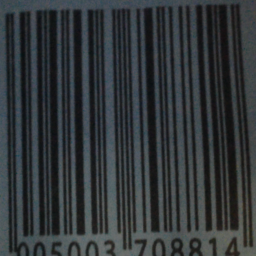

In [111]:
transforms.ToPILImage()(test_dataset[0])

In [107]:
for i in tqdm(range(len(test_dataset))):
    output = decoder.model(test_dataset[i][None, :].to('cuda')).squeeze()
    res = torch.argmax(torch.softmax(output, dim=1), dim=1)
    ans = int(''.join([str(i) for i in res.detach().cpu().numpy()]))
    test_data_markup.iloc[i, 1] = ans


100%|██████████| 100/100 [00:00<00:00, 163.31it/s][A


In [108]:
test_data_markup

,0,1,2,3,4,5,6,7,8,9,10
0,5825c9d1deb6572b6dba440d5c6482bf.png,29123506200,548,469,1691,444,1711,1338,568,1363,-
1,f9bf5d96a0cf5d64aac4eb5806554224.png,910750121311,572,1162,652,383,1821,502,1742,1281,-
2,a154b624c06072da1a01c97ebc3894c1.png,2471101113129,515,481,1570,301,1649,770,594,949,-
3,749003091876fc58be69db54bbaae8f1.png,2841201013512,510,263,1557,226,1572,653,526,691,-
4,560ca4ac1260313eb5979140c4f9ef31.png,121298430100,535,737,540,243,1654,255,1649,748,-
...,...,...,...,...,...,...,...,...,...,...,...
95,bf547f52301ee51df5faf1a6dc678740.png,9101240013121,741,193,2241,158,2289,2218,789,2252,-
96,d7d7c5f9109aa31aff407eeab054bfc7.png,1771200012512,421,644,1223,597,1309,2086,507,2132,-
97,d6230eb6dc78728c09024eb674c427ef.png,835401112121,234,495,686,485,708,1477,256,1487,-
98,f534d421c7e36d6133a5e9031a7e2dd5.png,34911012111121,219,456,648,451,665,2001,235,2006,-


In [109]:
test_data_markup.to_csv("./answer.csv", encoding='utf-16', header=None, index=None)

In [110]:
!python3 ./course_ocr_t3/evaluate.py

Checking answer (/home/jupyter/work/resources/ocr3/data/answer.csv) against markup(/home/jupyter/work/resources/ocr3/data/markup.csv)
recognition_accuracy=0.0
detection_result=1.0
score=0.35
